##Data Ingestion (Python)

In [ ]:
# File location and type
file_location = "/FileStore/tables/Hackathon_Ideal_Data.csv"
file_type = "csv"

# CSV options
infer_schema = "false"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
df = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

display(df)

MONTH,STORECODE,QTY,VALUE,GRP,SGRP,SSGRP,CMP,MBRD,BRD
M1,P1,25,83,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE HAIR FALL RESCUE
M1,P1,6,22,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE INTENSE REPAIR
M1,P1,4,15,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE OXYGEN MOISTURE
M1,P1,15,60,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,L'OREAL INDIA,GARNIER,FRUCTIS
M1,P2,0,0,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,CLINIC PLUS,CLINIC PLUS
M1,P2,1,90,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE DAILY SHINE
M1,P2,0,0,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE ENVIRONMENTAL DEFENCE
M1,P2,10,34,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE HAIR FALL RESCUE
M1,P2,11,37,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE INTENSE REPAIR
M1,P2,2,7,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE OXYGEN MOISTURE


In [ ]:
# Create a view or table

temp_table_name = "Sales_Data_csv"

df.createOrReplaceTempView(temp_table_name)

## Data Pre-Processing

In [ ]:
%sql

/* Query the created temp table in a SQL cell */

select * from `Sales_Data_csv`

MONTH,STORECODE,QTY,VALUE,GRP,SGRP,SSGRP,CMP,MBRD,BRD
M1,P1,25,83,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE HAIR FALL RESCUE
M1,P1,6,22,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE INTENSE REPAIR
M1,P1,4,15,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE OXYGEN MOISTURE
M1,P1,15,60,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,L'OREAL INDIA,GARNIER,FRUCTIS
M1,P2,0,0,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,CLINIC PLUS,CLINIC PLUS
M1,P2,1,90,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE DAILY SHINE
M1,P2,0,0,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE ENVIRONMENTAL DEFENCE
M1,P2,10,34,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE HAIR FALL RESCUE
M1,P2,11,37,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE INTENSE REPAIR
M1,P2,2,7,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE OXYGEN MOISTURE


In [ ]:
%sql
--Checking all datatypes are correct
describe sales_data_csv

col_name,data_type,comment
MONTH,string,null
STORECODE,string,null
QTY,string,null
VALUE,string,null
GRP,string,null
SGRP,string,null
SSGRP,string,null
CMP,string,null
MBRD,string,null
BRD,string,null


In [ ]:
%sql
/* Note that 'qty' and 'value' are of the wrong data type. This will be addressed. 
Now checking for 0 values in 'qty' and 'value'*/
SELECT count(*)
FROM sales_data_csv
WHERE qty <> 0 or value <> 0;

count(1)
11077


In [ ]:
%sql
--Creating a new table with all rows except where there was a value of 0 in 'qty' or 'value'
CREATE OR REPLACE TABLE sales_data_3 AS
SELECT *
FROM sales_data_csv
WHERE qty <> 0 or value <> 0;

num_affected_rows,num_inserted_rows


In [ ]:
%sql
--Creating a new column with the correct datatype and taking input from the original 'qty'
alter table sales_data_3 add column qty_num decimal(10,0);
update sales_data_3
set qty_num = qty;

num_affected_rows
11077


In [ ]:
%sql
--Creating a new column with the correct datatype and taking input from the original 'value'
alter table sales_data_3 add column value_num decimal(10,0);
update sales_data_3
set value_num = value;

num_affected_rows
11077


In [ ]:
%sql
--Setting properties to allow columns to be dropped by referring to the name.
ALTER TABLE sales_data_3 SET TBLPROPERTIES (
   'delta.columnMapping.mode' = 'name',
   'delta.minReaderVersion' = '2',
   'delta.minWriterVersion' = '5')

In [ ]:
%sql
--Dropping columns with incorrect datatypes
alter table sales_data_3 drop columns qty, value;

In [ ]:
# With this registered as a temp view, it will only be available to this particular notebook. If you'd like other users to be able to query this table, you can also create a table from the DataFrame.
# Once saved, this table will persist across cluster restarts as well as allow various users across different notebooks to query this data.
# To do so, choose your table name and uncomment the bottom line.

permanent_table_name = "Transactional_Sales_Data_csv"

# df.write.format("parquet").saveAsTable(permanent_table_name)

In [ ]:
%sql
--Checking rows where new variabels qty_num, value_num are equal to 0.
select * from sales_data_3 where qty_num = 0 or value_num = 0

MONTH,STORECODE,GRP,SGRP,SSGRP,CMP,MBRD,BRD,qty_num,value_num
M1,P4,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,PROCTER & GAMBLE,PANTENE,PANTENE CONDITIONER,8,0
M3,P10,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,PROCTER & GAMBLE,PANTENE,PANTENE CONDITIONER,14,0
M2,P8,LIQUID TOILET SOAPS (8/93),HAND WASH,HAND WASH,WIPRO CONS PRODS,SANTOOR,SANTOOR MILD,1,0
M1,P6,LIQUID TOILET SOAPS (8/93),BODY WASH,BODY WASH,I T C,FIAMA,FIAMA GEL+CREME,1,0
M1,P8,LIQUID TOILET SOAPS (8/93),HAND WASH,HAND WASH,WIPRO CONS PRODS,SANTOOR,SANTOOR MILD,2,0
M3,P8,WASHING POWDERS/LIQUIDS,WASHING POWDERS/LIQUIDS,WASHING POWDERS/LIQUIDS,RSPL LIMITED,UNI WASH,UNI WASH,2,0
M2,P8,WASHING POWDERS/LIQUIDS,WASHING POWDERS/LIQUIDS,WASHING POWDERS/LIQUIDS,RSPL LIMITED,UNI WASH,UNI WASH,1,0
M1,P8,WASHING POWDERS/LIQUIDS,WASHING POWDERS/LIQUIDS,WASHING POWDERS/LIQUIDS,RSPL LIMITED,UNI WASH,UNI WASH,1,0
M2,P1,CLEANERS - UTENSIL,TRADITIONAL,LIQUIDS,HINDUSTAN UNILEVER LIMITED,VIM,VIM DOUBLE POWER GEL,0,70
M2,P6,CLEANERS - UTENSIL,TRADITIONAL,BARS,JYOTHY LABORATORIES,PRIL,PRIL PERFECT,2,0


In [ ]:
%sql
--Removing rows where qty_num are 0.
delete from sales_data_3 where qty_num = 0;

num_affected_rows
5


In [ ]:
%sql
--Removing rows where value_num are 0.
delete from sales_data_3 where value_num = 0;

num_affected_rows
150


In [ ]:
%sql
--Checking that there are no remaining rows where qty_num/value_num are 0.
select * from sales_data_3 where qty_num = 0 or value_num = 0

MONTH,STORECODE,GRP,SGRP,SSGRP,CMP,MBRD,BRD,qty_num,value_num


In [ ]:
%sql
select *, round(value_num/qty_num,0) from sales_data_3 where value_num/qty_num = (select(max(value_num/qty_num)) from sales_data_3)

MONTH,STORECODE,GRP,SGRP,SSGRP,CMP,MBRD,BRD,qty_num,value_num,"round((value_num / qty_num), 0)"
M1,P6,WASHING POWDERS/LIQUIDS,WASHING POWDERS/LIQUIDS,WASHING POWDERS/LIQUIDS,PROCTER & GAMBLE,ARIEL,ARIEL FRONT LOAD,1,1069,1069


In [ ]:
%sql
--Adding an extra column unit_value that calculates the unit cost for each row or product.
ALTER TABLE sales_data_3 ADD column unit_value decimal(10,2);

UPDATE sales_data_3
SET unit_value = value_num/qty_num;


num_affected_rows
10922


In [ ]:
%sql
--Checking datatypes of all columns prior to moving forward.
describe sales_data_3

col_name,data_type,comment
MONTH,string,null
STORECODE,string,null
GRP,string,null
SGRP,string,null
SSGRP,string,null
CMP,string,null
MBRD,string,null
BRD,string,null
qty_num,"decimal(10,0)",null
value_num,"decimal(10,0)",null


## Exploratory Data Analysis

In [ ]:
%sql
--Descriptive statistics for qty_num
SELECT
    COUNT(qty_num) AS count,
    MIN(qty_num) AS min_value,
    MAX(qty_num) AS max_value,
    AVG(qty_num) AS mean,
    SUM(qty_num) AS sum,
    STDDEV(qty_num) AS standard_deviation,
    PERCENTILE_CONT(0.25) WITHIN GROUP (ORDER BY qty_num) AS percentile_25,
    PERCENTILE_CONT(0.50) WITHIN GROUP (ORDER BY qty_num) AS median,
    PERCENTILE_CONT(0.75) WITHIN GROUP (ORDER BY qty_num) AS percentile_75
FROM
    sales_data_3;

count,min_value,max_value,mean,sum,standard_deviation,percentile_25,median,percentile_75
10922,1,641,21.2836,232459,37.903975594537165,3.0,8.0,23.0


In [ ]:
%sql
--Descriptive statistics for value_num
SELECT
    MIN(value_num) AS min_value,
    MAX(value_num) AS max_value,
    AVG(value_num) AS mean,
    SUM(value_num) AS sum,
    STDDEV(value_num) AS standard_deviation,
    PERCENTILE_CONT(0.25) WITHIN GROUP (ORDER BY value_num) AS percentile_25,
    PERCENTILE_CONT(0.50) WITHIN GROUP (ORDER BY value_num) AS median,
    PERCENTILE_CONT(0.75) WITHIN GROUP (ORDER BY value_num) AS percentile_75
FROM
    sales_data_3;

count,min_value,max_value,mean,sum,standard_deviation,percentile_25,median,percentile_75
10922,1,24185,384.4118,4198546,848.4245878423915,68.0,165.0,378.0


In [ ]:
%sql
--Ensuring no further 0 values in qty_num/value_num
select month, storecode, qty_num, value_num, unit_value from sales_data_3 where unit_value = 0

month,storecode,qty_num,value_num,unit_value


In [ ]:
%sql
--Descriptive statistics for unit_value
SELECT
    COUNT(unit_value) AS count,
    MIN(unit_value) AS min_value,
    MAX(unit_value) AS max_value,
    AVG(unit_value) AS mean,
    SUM(unit_value) AS sum,
    STDDEV(unit_value) AS standard_deviation,
    PERCENTILE_CONT(0.25) WITHIN GROUP (ORDER BY unit_value) AS percentile_25,
    PERCENTILE_CONT(0.50) WITHIN GROUP (ORDER BY unit_value) AS median,
    PERCENTILE_CONT(0.75) WITHIN GROUP (ORDER BY unit_value) AS percentile_75
FROM
    sales_data_3;

count,min_value,max_value,mean,sum,standard_deviation,percentile_25,median,percentile_75
10922,0.50,1069.00,40.871838,446402.22,66.6294493337085,9.67,19.8,47.815


In [ ]:
%sql
--Count for unique months
SELECT COUNT(DISTINCT MONTH) as Unique_Months FROM sales_data_3

Unique_Months
3


In [ ]:
%sql
--Obtaining number of Unique Values and Unique Items in Total using a combination of columns as an identifier.
SELECT 
  a.Unique_Months,
  b.Unique_Stores,
  c.Unique_Grp,
  d.Unique_Sgrp,
  e.Unique_Ssgrp,
  f.Unique_Cmp,
  g.Unique_Mbrd,
  h.Unique_Brd,
  i.Unique_Items
FROM 
  (SELECT COUNT(DISTINCT MONTH) as Unique_Months FROM sales_data_3 as Unique_Months) a,
  (SELECT COUNT(DISTINCT STORECODE) as Unique_Stores FROM sales_data_3 as Unique_Stores) b,
  (SELECT COUNT(DISTINCT GRP) as Unique_Grp FROM sales_data_3 as Unique_Grp) c,
  (SELECT COUNT(DISTINCT SGRP) as Unique_Sgrp FROM sales_data_3 as Unique_Sgrp) d,
  (SELECT COUNT(DISTINCT SSGRP) as Unique_Ssgrp FROM sales_data_3 as Unique_Ssgrp) e,
  (SELECT COUNT(DISTINCT CMP) as Unique_Cmp FROM sales_data_3 as Unique_Cmp) f,
  (SELECT COUNT(DISTINCT MBRD) as Unique_Mbrd FROM sales_data_3 as Unique_Mbrd) g,
  (SELECT COUNT(DISTINCT BRD) as Unique_Brd FROM sales_data_3 as Unique_Brd) h,
  (select count(DISTINCT concat(grp,'/',sgrp,'/',ssgrp,'/',cmp,'/',mbrd,'/',brd)) as Unique_Items from sales_data_3 as Unique_Items) i

Unique_Months,Unique_Stores,Unique_Grp,Unique_Sgrp,Unique_Ssgrp,Unique_Cmp,Unique_Mbrd,Unique_Brd,Unique_Items
3,10,80,173,238,471,766,1444,1904


In [ ]:
%sql
--Order with largest quantity
Select * from sales_data_3
  WHERE qty_num = (
  SELECT MAX(qty_num)
  FROM sales_data_3)


MONTH,STORECODE,GRP,SGRP,SSGRP,CMP,MBRD,BRD,qty_num,value_num,unit_value
M1,P10,CONFECTIONERY - TOTAL GUM,BUBBLE GUMS,BUBBLE GUMS,PERFETTI VAN MELLE,CENTER FRUIT,CENTER FRUIT,641,641,1.00


In [ ]:
%sql

-- Total Sales Value by Storecode
    
SELECT 
  STORECODE, 
  SUM(value_num) as TotalValue
FROM sales_data_3
GROUP BY STORECODE
ORDER BY TotalValue DESC

STORECODE,TotalValue
P8,671902
P7,571136
P6,502517
P4,471566
P3,428550
P5,335086
P1,334640
P9,313426
P10,285699
P2,284024


In [ ]:
%sql

-- Total Sales Value by Storecode
    
SELECT 
  STORECODE, 
  SUM(qty_num) as TotalUnits
FROM sales_data_3
GROUP BY STORECODE
ORDER BY TotalUnits DESC

STORECODE,TotalUnits
P4,34041
P8,31947
P3,27586
P5,25990
P10,21299
P6,21018
P9,20843
P7,20822
P1,18481
P2,10432


In [ ]:
%sql
--Number of unique products sold by each store throughout the 3 month period
select storecode, count(DISTINCT *) as UniqueProducts 
from (select storecode, 
    concat(grp,'/',sgrp,'/',ssgrp,'/',cmp,'/',mbrd,'/',brd) 
  from sales_data_3) 
group by storecode 
order by UniqueProducts desc

storecode,UniqueProducts
P8,815
P6,739
P10,565
P3,494
P2,468
P4,441
P9,415
P1,386
P7,296
P5,248


In [ ]:
%sql
--Revenue per Unit Sold
Select storecode, round(avg(unit_value),2) as RevenuePerUnit 
from sales_data_3 
group by storecode 
order by RevenuePerUnit desc

storecode,RevenuePerUnit
P6,54.74
P7,50.01
P8,45.06
P2,44.56
P1,40.08
P3,37.08
P9,36.92
P4,34.60
P10,29.52
P5,22.92


In [ ]:
%sql
--Revenue Per Sale 
select storecode, SUM(value_num) as TotalRevenue, count(*) as NumberOfSales, round(SUM(value_num)/NumberOfSales,2) as RevenuePerSale 
from sales_data_3 
group by storecode 
order by RevenuePerSale desc

storecode,TotalRevenue,NumberOfSales,RevenuePerSale
P7,571136,730,782.38
P5,335086,615,544.86
P4,471566,1086,434.22
P3,428550,1109,386.43
P1,334640,910,367.74
P8,671902,1872,358.92
P6,502517,1532,328.01
P9,313426,961,326.15
P2,284024,980,289.82
P10,285699,1127,253.50


In [ ]:
%sql
--Stores with the greatest variety (number of brands sold) by month
select month, storecode, count(DISTINCT *) as UniqueProducts from (select month, storecode, concat(grp,'/',sgrp,'/',ssgrp,'/',cmp,'/',mbrd,'/',brd) from sales_data_3) group by month, storecode order by UniqueProducts desc limit 10

month,storecode,UniqueProducts
M3,P8,660
M1,P8,635
M2,P8,577
M3,P6,541
M2,P6,519
M1,P6,472
M2,P10,404
M1,P3,391
M2,P4,365
M3,P10,365


In [ ]:
%sql
--Largest order values by store by month
Select month, storecode, max(value_num) as MaxValue from sales_data_3 group by month, storecode order by MaxValue desc limit 10

month,storecode,MaxValue
M2,P7,24185
M3,P7,21352
M2,P9,16425
M1,P7,16001
M2,P8,15820
M3,P3,15571
M1,P8,15120
M1,P3,11662
M2,P3,11635
M2,P4,11336


In [ ]:
%sql
--Largest order values by store by month
Select month, storecode, max(qty_num) as MaxQuantity 
from sales_data_3 
group by month, storecode 
order by MaxQuantity desc limit 10

month,storecode,MaxQuantity
M1,P10,641
M3,P9,625
M3,P6,605
M1,P1,554
M2,P6,541
M1,P7,422
M2,P7,416
M1,P9,407
M2,P9,392
M3,P10,336


In [ ]:
%sql
--Revenue per Unit Sold by month
Select month, storecode, round(avg(unit_value),2) as RevenuePerUnit 
from sales_data_3 
group by month, storecode 
order by RevenuePerUnit desc limit 10

month,storecode,RevenuePerUnit
M2,P6,57.04
M1,P6,53.61
M3,P6,53.51
M2,P7,51.54
M3,P7,50.19
M3,P8,48.86
M1,P7,48.30
M1,P2,47.50
M1,P8,45.55
M3,P3,44.92


In [ ]:
%sql
--Revenue Per Sale by Month
select month, storecode, SUM(value_num) as TotalRevenue, count(*) as NumberOfSales, round(SUM(value_num)/NumberOfSales,2) as RevenuePerSale 
from sales_data_3 
group by month, storecode 
order by RevenuePerSale desc limit 10

month,storecode,TotalRevenue,NumberOfSales,RevenuePerSale
M2,P7,215617,241,894.68
M1,P7,179999,240,750.00
M3,P7,175520,249,704.90
M1,P5,115460,208,555.10
M3,P5,108867,200,544.34
M2,P5,110759,207,535.07
M1,P4,161620,361,447.70
M2,P4,159756,365,437.69
M3,P4,150190,360,417.19
M1,P3,153630,391,392.92


In [ ]:
%sql

/*Counts of different columns: For any given column, we find the count of distinct values 
by using a combination of 'grp', 'sgrp', 'ssgrp', 'cmp', 'mbrd', 'brd'.*/

SELECT 
  a.total_qty,
  b.unique_brands,
  c.stores_per_brand,
  d.categories_per_location,
  e.categories_per_store,
  f.avg_value_per_item
FROM 
  (SELECT SUM(qty_num) as total_qty FROM sales_data_3) a,
  (SELECT COUNT(DISTINCT BRD) as unique_brands FROM sales_data_3) b,
  (SELECT COUNT(DISTINCT STORECODE) / COUNT(DISTINCT BRD) as stores_per_brand FROM sales_data_3) c,
  (SELECT COUNT(DISTINCT GRP) / COUNT(DISTINCT STORECODE) as categories_per_location FROM sales_data_3) d,
  (SELECT COUNT(DISTINCT GRP) / COUNT(DISTINCT STORECODE) as categories_per_store FROM sales_data_3) e,
  (SELECT SUM(value_num) / COUNT(DISTINCT concat(grp,'/',sgrp,'/',ssgrp,'/',cmp,'/',mbrd,'/',brd)) as avg_value_per_item FROM sales_data_3) f


total_qty,unique_brands,stores_per_brand,categories_per_location,categories_per_store,avg_value_per_item
232459,1444,0.006925207756232687,8.0,8.0,2205.118697478991596639


In [ ]:
%sql

-- Calculate the total VALUE and the total QTY for each BRD in the sales_data table, divides the total VALUE by the total QTY to get the average value per unit, sorting the results in descending order of the average value per unit

SELECT 
  MBRD,
  round(SUM(value_num) / SUM(qty_num),2) as AverageValuePerUnit
FROM sales_data_3
GROUP BY MBRD
ORDER BY AverageValuePerUnit DESC

MBRD,AverageValuePerUnit
SUN GIFT,983.00
GUINEA,971.25
SWEEKAR,699.00
GEMLIFE,672.50
SAURASHTRA,623.00
DUNAR,495.00
MR WHITE,465.00
SIZMIC,437.50
OLEEV HEALTH,422.14
SAGAR,326.24


In [ ]:
%sql
select storecode, mbrd, sum(value_num) as TotalRevenue from sales_data_3 group by mbrd, storecode order by mbrd, totalrevenue desc

storecode,mbrd,TotalRevenue
P3,5 STAR,4873
P6,5 STAR,2443
P10,5 STAR,1931
P1,5 STAR,1821
P8,5 STAR,1720
P4,5 STAR,1255
P2,5 STAR,523
P7,5 STAR,344
P5,50-50,2648
P6,50-50,1411


In [ ]:
%sql
-- Find the total quantity sold for each product by brand

SELECT 
  MBRD,
  SUM(qty_num) as TotalQuantitySold,
  SUM(value_num) as TotalRevenue
FROM sales_data_3
GROUP BY MBRD
ORDER BY TotalQuantitySold DESC, TotalRevenue DESC

MBRD,TotalQuantitySold,TotalRevenue
EVEREST,11497,170465
BALAJI,10704,55579
RIN,5716,73145
PARLE-G,4949,30441
YELLOW DIAMOND,4813,24037
WHEEL,4789,71443
CLINIC PLUS,4758,9176
SUNSILK,4488,11461
DOVE,4443,32885
CADBURY DAIRY MILK,4236,93947


In [ ]:
%sql

-- calculate the total quantities and revenue sold for each product at each store in the product_sales table. We then rank these sales within each store in the ranked_sales table. The product with the most quantity sold at a store will have a rank of 1.

-- We also calculate the total revenue for each store in the store_revenue table.

-- In the final query, we join the store total revenue with the best-selling categories and their total revenue from the ranked_sales table. We then calculate the percentage of total revenue that the best selling category accounts for.

WITH product_sales AS (
  SELECT 
    STORECODE,
    grp,
    SUM(QTY_num) as TotalQuantitySold,
    SUM(VALUE_num) as TotalCategoryRevenue
  FROM sales_data_3
  GROUP BY STORECODE, grp
),
ranked_sales AS (
  SELECT 
    STORECODE, 
    grp,
    TotalQuantitySold,
    TotalCategoryRevenue,
    ROW_NUMBER() OVER (PARTITION BY STORECODE ORDER BY TotalQuantitySold DESC) as rank
  FROM product_sales
),
store_revenue AS (
  SELECT 
    STORECODE,
    SUM(VALUE_num) as TotalRevenue
  FROM sales_data_3
  GROUP BY STORECODE
)
SELECT 
  store_revenue.STORECODE,
  store_revenue.TotalRevenue,
  best_selling_product.grp as BestSellingCategory,
  best_selling_product.TotalCategoryRevenue,
  round((best_selling_product.TotalCategoryRevenue / store_revenue.TotalRevenue) * 100, 2) as PercentageRevenueBestSellingCategory
FROM store_revenue
LEFT JOIN ranked_sales as best_selling_product
ON store_revenue.STORECODE = best_selling_product.STORECODE AND best_selling_product.rank = 1
ORDER BY TotalRevenue DESC


STORECODE,TotalRevenue,BestSellingCategory,TotalCategoryRevenue,PercentageRevenueBestSellingCategory
P8,671902,SALTY SNACKS (2/97),42504,6.33
P7,571136,BISCUITS - CORE & NON CORE,31198,5.46
P6,502517,SALTY SNACKS (2/97),36050,7.17
P4,471566,SALTY SNACKS (2/97),31223,6.62
P3,428550,SPICES (03/04),43163,10.07
P5,335086,SPICES (03/04),53532,15.98
P1,334640,BISCUITS - CORE & NON CORE,28397,8.49
P9,313426,BISCUITS - CORE & NON CORE,26757,8.54
P10,285699,BISCUITS - CORE & NON CORE,36472,12.77
P2,284024,BISCUITS - CORE & NON CORE,17697,6.23


In [ ]:
%sql

-- provide a count of unique months of data for each STORECODE, showing the stores with the most months of activity.

SELECT 
  STORECODE,
  COUNT(DISTINCT MONTH) as NumberOfMonths
FROM sales_data_3
GROUP BY STORECODE
ORDER BY NumberOfMonths DESC

STORECODE,NumberOfMonths
P2,3
P7,3
P8,3
P10,3
P3,3
P4,3
P5,3
P1,3
P6,3
P9,3


In [ ]:
%sql

-- average quantity and quantity standard deviation rounded to two decimal places.

WITH store_sales AS (
  SELECT 
    STORECODE, 
    BRD, 
    SUM(qty_num) AS TotalQuantity
  FROM sales_data_3
  GROUP BY STORECODE, BRD
),

store_sales_stats AS (
  SELECT 
    STORECODE,
    ROUND(AVG(TotalQuantity), 2) AS AverageQuantity,
    ROUND(STDDEV(TotalQuantity), 2) AS QuantityStdDev
  FROM store_sales
  GROUP BY STORECODE
)

SELECT 
  sales_data_3.STORECODE, 
  sales_data_3.TotalSales, 
  stats.AverageQuantity,
  stats.QuantityStdDev
FROM (
  SELECT 
    STORECODE,
    SUM(qty_num) AS TotalSales
  FROM sales_data_3
  GROUP BY STORECODE
) sales_data_3
LEFT JOIN store_sales_stats stats ON sales_data_3.STORECODE = stats.STORECODE
ORDER BY sales_data_3.TotalSales DESC

STORECODE,TotalSales,AverageQuantity,QuantityStdDev
P4,34041,91.75,165.93
P8,31947,46.23,80.03
P3,27586,69.66,165.15
P5,25990,133.97,295.06
P10,21299,46.71,93.68
P6,21018,34.29,75.6
P9,20843,59.72,137.62
P7,20822,82.96,162.09
P1,18481,57.22,99.72
P2,10432,26.68,70.17


In [ ]:
%sql

-- Time-series Analysis: convert the InvoiceDate to a proper datetime format and extract different time components ( month, day of the week, hour of the day), which is then used to understand patterns and trends in sales over time

SELECT 
  MONTH,
  STORECODE,
  GRP AS Category,
  SUM(QTY_num) AS TotalQuantity
FROM sales_data_3
GROUP BY STORECODE, MONTH, GRP
ORDER BY MONTH ASC, TotalQuantity DESC, STORECODE ASC

MONTH,STORECODE,Category,TotalQuantity
M1,P4,SALTY SNACKS (2/97),1892
M1,P8,SALTY SNACKS (2/97),1864
M1,P5,SPICES (03/04),1791
M1,P4,BISCUITS - CORE & NON CORE,1662
M1,P10,BISCUITS - CORE & NON CORE,1477
M1,P3,SPICES (03/04),1446
M1,P3,BISCUITS - CORE & NON CORE,1425
M1,P1,BISCUITS - CORE & NON CORE,1399
M1,P5,BISCUITS - CORE & NON CORE,1364
M1,P8,BISCUITS - CORE & NON CORE,1287


In [ ]:
#Retrieving data from Databricks SQL table
sales_data_3 = "sales_data_3"
df = spark.table(sales_data_3)
display(df)

MONTH,STORECODE,GRP,SGRP,SSGRP,CMP,MBRD,BRD,qty_num,value_num,unit_value
M1,P1,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE HAIR FALL RESCUE,25,83,3.32
M1,P1,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE INTENSE REPAIR,6,22,3.67
M1,P1,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE OXYGEN MOISTURE,4,15,3.75
M1,P1,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,L'OREAL INDIA,GARNIER,FRUCTIS,15,60,4.00
M1,P2,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE DAILY SHINE,1,90,90.00
M1,P2,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE HAIR FALL RESCUE,10,34,3.40
M1,P2,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE INTENSE REPAIR,11,37,3.36
M1,P2,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE OXYGEN MOISTURE,2,7,3.50
M1,P2,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,SUNSILK,SUNSILK THICK & LONG,4,12,3.00
M1,P3,HAIR CONDITIONERS,HAIR CONDITIONERS,HAIR CONDITIONERS,HINDUSTAN UNILEVER LIMITED,DOVE,DOVE DAILY SHINE,29,116,4.00


In [ ]:
#Packages needed for figures
import matplotlib.pyplot as plt

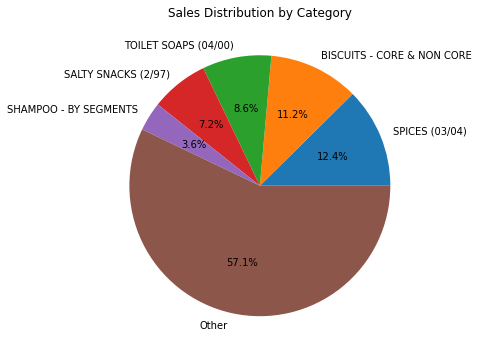

In [ ]:
# Pie Chart of Sales Distribution by Category, displaying top 5

# Converting the Spark DataFrame to a Pandas DataFrame
pandas_df = df.select("grp").toPandas()

# Calculate the count of each category
category_counts = pandas_df["grp"].value_counts()

# Select the top 5 categories and group the rest as "Other"
top_categories = category_counts[:5]
other_categories = category_counts[5:]
other_count = other_categories.sum()
top_categories["Other"] = other_count

# Create a pie chart
plt.figure(figsize=(8, 6))
top_categories.plot(kind='pie', autopct='%1.1f%%')
plt.title("Sales Distribution by Category")
plt.ylabel("")
plt.show()

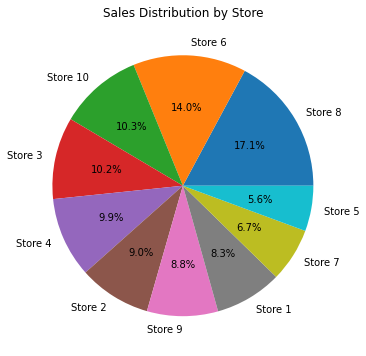

In [ ]:
# Pie chart of Sales Distribution by Store

# Converting the Spark DataFrame to a Pandas DataFrame
pandas_df = df.select("STORECODE").toPandas()

# Calculate the count of each month
store_counts = pandas_df["STORECODE"].value_counts()

# Create a dictionary to map the month labels
store_labels = {
    "P1": "Store 1",
    "P2": "Store 2",
    "P3": "Store 3",
    "P4": "Store 4",
    "P5": "Store 5",
    "P6": "Store 6",
    "P7": "Store 7",
    "P8": "Store 8",
    "P9": "Store 9",
    "P10": "Store 10",
}

# Rename the month labels
store_counts.rename(index=store_labels, inplace=True)

# Create a pie chart
plt.figure(figsize=(8, 6))
store_counts.plot(kind='pie', autopct='%1.1f%%')
plt.title("Sales Distribution by Store")
plt.ylabel("")
plt.show()

/databricks/spark/python/pyspark/sql/pandas/utils.py:124: UserWarning: The conversion of DecimalType columns is inefficient and may take a long time. Column names: [qty_num] If those columns are not necessary, you may consider dropping them or converting to primitive types before the conversion.
  warnings.warn(


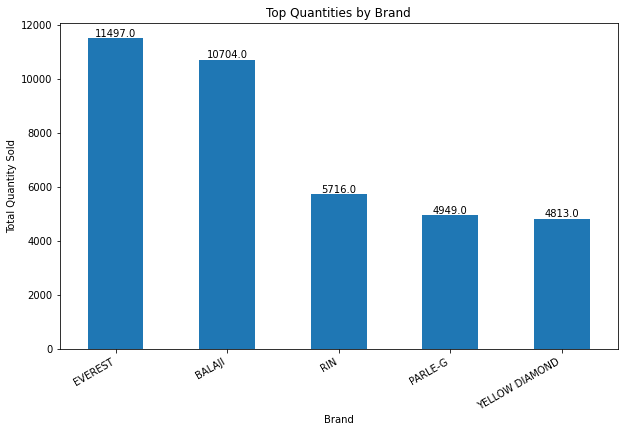

In [ ]:
# Top 5 Quantities by Brand

# Convert the Spark DataFrame to a Pandas DataFrame
pandas_df = df.select("MBRD", "qty_num").toPandas()

# Convert "totalquantitysold" column to float data type
pandas_df["qty_num"] = pandas_df["qty_num"].astype(float)

# Calculate the sum of quantities by brand
brand_quantities = pandas_df.groupby("MBRD")["qty_num"].sum()

# Select the top quantities by brand
top_brand_quantities = brand_quantities.nlargest(5)

# Create a bar graph
plt.figure(figsize=(10, 6))
ax = top_brand_quantities.plot(kind='bar')
plt.title("Top Quantities by Brand")
plt.xlabel("Brand")
plt.ylabel("Total Quantity Sold")
plt.xticks(rotation=30, ha = 'right')
for p in ax.patches:
    ax.annotate(str(round(p.get_height(), 2)), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 5), textcoords='offset points')
plt.show()

/databricks/spark/python/pyspark/sql/pandas/utils.py:124: UserWarning: The conversion of DecimalType columns is inefficient and may take a long time. Column names: [value_num] If those columns are not necessary, you may consider dropping them or converting to primitive types before the conversion.
  warnings.warn(


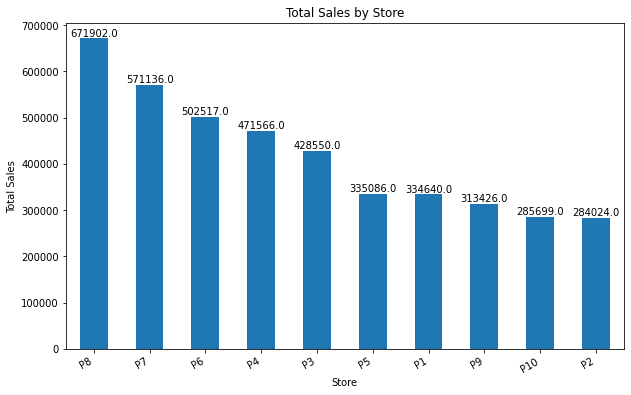

In [ ]:
# Total Sale Values by Store

# Convert the Spark DataFrame to a Pandas DataFrame
pandas_df = df.select("storecode", "value_num").toPandas()

# Convert "value_num" column to float data type
pandas_df["value_num"] = pandas_df["value_num"].astype(float)

# Calculate the sum of sale value by brand
brand_quantities = pandas_df.groupby("storecode")["value_num"].sum()

# Select the top sale values by brand
top_store_values = brand_quantities.nlargest(10)

# Create a bar graph
plt.figure(figsize=(10, 6))
ax = top_store_values.plot(kind='bar')
plt.title("Total Sales by Store")
plt.xlabel("Store")
plt.ylabel("Total Sales")
plt.xticks(rotation=30, ha = 'right')
for p in ax.patches:
    ax.annotate(str(round(p.get_height(), 2)), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 5), textcoords='offset points')
plt.show()

/databricks/spark/python/pyspark/sql/pandas/utils.py:124: UserWarning: The conversion of DecimalType columns is inefficient and may take a long time. Column names: [qty_num] If those columns are not necessary, you may consider dropping them or converting to primitive types before the conversion.
  warnings.warn(


<Figure size 720x432 with 0 Axes>

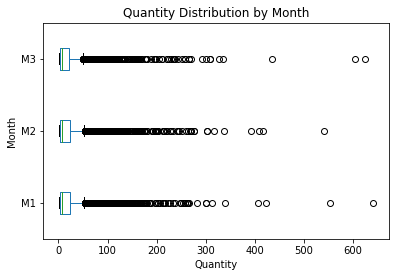

In [ ]:
#Boxplot of Quantities by Month

# Convert the Spark DataFrame to a Pandas DataFrame
pandas_df = df.select("MONTH", "qty_num").toPandas()

# Round the decimal values in "qty_num" column
pandas_df["qty_num"] = pandas_df["qty_num"].astype(float)

# Create a boxplot for each month
plt.figure(figsize=(10,6))
pandas_df.boxplot(column="qty_num", by="MONTH", grid=False, vert=False)
plt.title("Quantity Distribution by Month")
plt.xlabel("Quantity")
plt.ylabel("Month")
plt.suptitle("")  # Remove the default title
plt.show()


In [ ]:
%sql
--Explicit values for value_num boxplot
SELECT
  month,
  SUM(value_num) AS total_sale_value,
  AVG(value_num) AS average_sale_value,
  PERCENTILE_CONT(0.25) WITHIN GROUP (ORDER BY value_num) AS percentile_25,
  PERCENTILE_CONT(0.75) WITHIN GROUP (ORDER BY value_num) AS percentile_75,
  PERCENTILE_CONT(0.5) WITHIN GROUP (ORDER BY value_num) AS median,
  PERCENTILE_CONT(0.75) WITHIN GROUP (ORDER BY value_num) - PERCENTILE_CONT(0.25) WITHIN GROUP (ORDER BY value_num) AS iqr
FROM
  sales_data_3
GROUP BY
  month;


month,total_sale_value,average_sale_value,percentile_25,percentile_75,median,iqr
M1,1389256,386.0117,64.0,370.0,161.0,306.0
M2,1413347,383.9573,70.0,372.0,160.0,302.0
M3,1395943,383.2902,71.0,394.0,170.0,323.0


In [ ]:
%sql
--Explicit values for qty_num boxplot

SELECT
  month,
  SUM(qty_num) AS total_sale_value,
  AVG(qty_num) AS average_sale_value,
  PERCENTILE_CONT(0.25) WITHIN GROUP (ORDER BY qty_num) AS percentile_25,
  PERCENTILE_CONT(0.75) WITHIN GROUP (ORDER BY qty_num) AS percentile_75,
  PERCENTILE_CONT(0.5) WITHIN GROUP (ORDER BY qty_num) AS median,
  PERCENTILE_CONT(0.75) WITHIN GROUP (ORDER BY qty_num) - PERCENTILE_CONT(0.25) WITHIN GROUP (ORDER BY qty_num) AS iqr
FROM
  sales_data_3
GROUP BY
  month;


month,total_sale_value,average_sale_value,percentile_25,percentile_75,median,iqr
M1,76798,21.3387,3.0,23.0,8.0,20.0
M2,78444,21.3105,3.0,23.0,8.0,20.0
M3,77217,21.2018,3.0,22.0,8.0,19.0


/databricks/spark/python/pyspark/sql/pandas/utils.py:124: UserWarning: The conversion of DecimalType columns is inefficient and may take a long time. Column names: [qty_num] If those columns are not necessary, you may consider dropping them or converting to primitive types before the conversion.
  warnings.warn(


<Figure size 720x432 with 0 Axes>

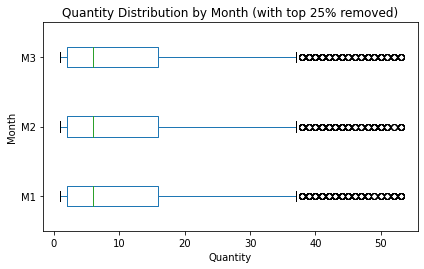

In [ ]:
# Boxplot of Quantities by Month with top 25% removed

# Convert the Spark DataFrame to a Pandas DataFrame
pandas_df = df.select("MONTH", "qty_num").toPandas()

# Round the decimal values in "qty_num" column
pandas_df["qty_num"] = pandas_df["qty_num"].astype(float)

# Calculate the threshold for removing the top 25% outliers
q3 = pandas_df["qty_num"].quantile(0.75)
threshold = q3 + 1.5 * (q3 - pandas_df["qty_num"].quantile(0.25))

# Filter out the outliers
pandas_df = pandas_df[pandas_df["qty_num"] <= threshold]

# Create a box plot of quantities by month without the top 25% outliers
plt.figure(figsize=(10, 6))
pandas_df.boxplot(column="qty_num", by="MONTH", grid=False, vert = False)
plt.title("Quantity Distribution by Month (with top 25% removed)")
plt.xlabel("Quantity")
plt.ylabel("Month")
plt.suptitle("")  # Remove the default title

plt.tight_layout()
plt.show()

/databricks/spark/python/pyspark/sql/pandas/utils.py:124: UserWarning: The conversion of DecimalType columns is inefficient and may take a long time. Column names: [value_num] If those columns are not necessary, you may consider dropping them or converting to primitive types before the conversion.
  warnings.warn(


<Figure size 1368x720 with 0 Axes>

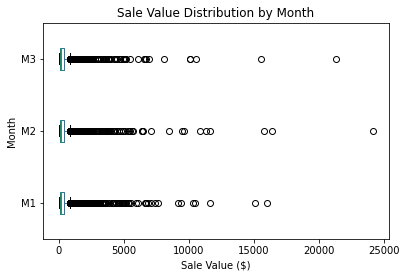

In [ ]:
# Boxplots of Order Value Distribution by Month

# Convert the Spark DataFrame to a Pandas DataFrame
pandas_df = df.select("MONTH", "value_num").toPandas()

# Round the decimal values in "qty_num" column
pandas_df["value_num"] = pandas_df["value_num"].astype(float)

# Create a boxplot for each month
plt.figure(figsize=(19, 10))
pandas_df.boxplot(column="value_num", by="MONTH", grid=False, vert=False)
plt.title("Sale Value Distribution by Month")
plt.xlabel("Sale Value ($)")
plt.ylabel("Month")
plt.suptitle("")  # Remove the default title
plt.show()


/databricks/spark/python/pyspark/sql/pandas/utils.py:124: UserWarning: The conversion of DecimalType columns is inefficient and may take a long time. Column names: [value_num] If those columns are not necessary, you may consider dropping them or converting to primitive types before the conversion.
  warnings.warn(


<Figure size 720x432 with 0 Axes>

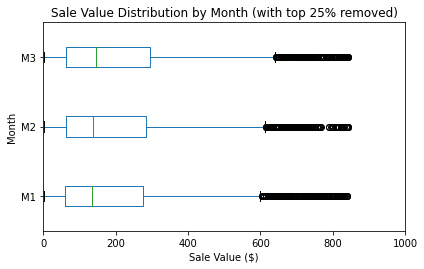

In [ ]:
# Boxplot of Quantities by Month with top 25% removed

# Convert the Spark DataFrame to a Pandas DataFrame
pandas_df = df.select("MONTH", "value_num").toPandas()

# Round the decimal values in "value_num" column
pandas_df["value_num"] = pandas_df["value_num"].astype(float)

# Calculate the threshold for removing the top 25% outliers
q3 = pandas_df["value_num"].quantile(0.75)
threshold = q3 + 1.5 * (q3 - pandas_df["value_num"].quantile(0.25))

# Filter out the outliers
pandas_df = pandas_df[pandas_df["value_num"] <= threshold]

# Create a box plot of quantities by month without the top 25% outliers
plt.figure(figsize=(10, 6))
pandas_df.boxplot(column="value_num", by="MONTH", grid=False, vert = False)
plt.title("Sale Value Distribution by Month (with top 25% removed)")
plt.xlabel("Sale Value ($)")
plt.ylabel("Month")
plt.suptitle("")  # Remove the default title

plt.tight_layout()
plt.show()

/databricks/spark/python/pyspark/sql/pandas/utils.py:124: UserWarning: The conversion of DecimalType columns is inefficient and may take a long time. Column names: [value_num] If those columns are not necessary, you may consider dropping them or converting to primitive types before the conversion.
  warnings.warn(


<Figure size 864x432 with 0 Axes>

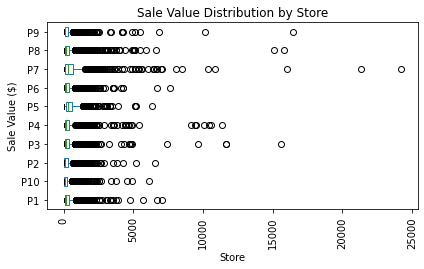

In [ ]:
# Order Value Distribution by Store (Cumulative)

# Convert the Spark DataFrame to a Pandas DataFrame
pandas_df = df.select("storecode", "value_num").toPandas()

# Round the decimal values in "qty_num" column
pandas_df["value_num"] = pandas_df["value_num"].astype(float)

# Create a box plot of all stores and their order values
plt.figure(figsize=(12, 6))
pandas_df.boxplot(column="value_num", by="storecode", grid=False, vert=False)
plt.title("Sale Value Distribution by Store")
plt.xlabel("Store")
plt.ylabel("Sale Value ($)")
plt.suptitle("")  # Remove the default title
plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility

plt.tight_layout()
plt.show()

/databricks/spark/python/pyspark/sql/pandas/utils.py:124: UserWarning: The conversion of DecimalType columns is inefficient and may take a long time. Column names: [value_num] If those columns are not necessary, you may consider dropping them or converting to primitive types before the conversion.
  warnings.warn(


<Figure size 864x432 with 0 Axes>

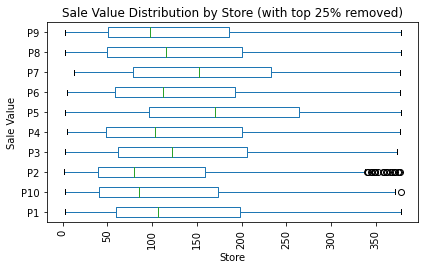

In [ ]:
# Order Value Distribution by Store (Cumulative with top 25% removed)

# Convert the Spark DataFrame to a Pandas DataFrame
pandas_df = df.select("storecode", "value_num").toPandas()

# Round the decimal values in "qty_num" column
pandas_df["value_num"] = pandas_df["value_num"].astype(float).round()

q3 = pandas_df["value_num"].quantile(0.75)
pandas_df = pandas_df[pandas_df["value_num"] <= q3]

# Create a box plot of all stores and their order values without outliers
plt.figure(figsize=(12, 6))
pandas_df.boxplot(column="value_num", by="storecode", grid=False, vert = False)
plt.title("Sale Value Distribution by Store (with top 25% removed)")
plt.xlabel("Store")
plt.ylabel("Sale Value")
plt.suptitle("")  # Remove the default title
plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility

plt.tight_layout()
plt.show()

In [ ]:
# Sale Quantities by Month

# Convert the Spark DataFrame to a Pandas DataFrame
pandas_df = df.select("month", "qty_num").toPandas()

# Round the decimal values in "qty_num" column
pandas_df["qty_num"] = pandas_df["qty_num"].astype(float).round()

# Calculate the total quantities by month
#quantities_by_month = pandas_df.groupby("month")["qty_num"].sum().reset_index()

# Sort the quantities in descending order
#quantities_by_month = quantities_by_month.sort_values("qty_num", ascending=False)

# Create a bar graph of quantities by month
plt.figure(figsize=(8, 6))
plt.bar(pandas_df["month"], pandas_df["qty_num"])
plt.title("Quantities by Month")
plt.xlabel("Month")
plt.ylabel("Quantity")

# Define the desired order of months
month_order = ["M1", "M2", "M3"]

# Set the x-axis tick labels in the desired order
plt.xticks(pandas_df["month"])

# Add labels on top of the bars
for i, value in enumerate(pandas_df["qty_num"]):
    plt.text(i, value, str(value), ha="center", va="bottom")

plt.tight_layout()
plt.show()

/databricks/spark/python/pyspark/sql/pandas/utils.py:124: UserWarning: The conversion of DecimalType columns is inefficient and may take a long time. Column names: [qty_num] If those columns are not necessary, you may consider dropping them or converting to primitive types before the conversion.
  warnings.warn(
<command-1323121099492434>:32: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


<Figure size 576x432 with 1 Axes>

In [ ]:
# Top 5 Decline in Sales by Product

# Convert Spark DataFrame to pandas DataFrame
pandas_df = df.select("month", "qty_num", "grp").toPandas()

# Round the decimal values in "qty_num" column
pandas_df["qty_num"] = pandas_df["qty_num"].astype(float)

# Calculate decline for each product and month
product_decline = pandas_df.groupby(['grp', 'month']).agg({'qty_num': 'sum'}).reset_index()
product_decline['decline'] = product_decline.groupby('grp')['qty_num'].diff()

# Find the top 5 products with the greatest decline
top_5_decline = product_decline.groupby('grp')['decline'].sum().nlargest(5).reset_index()

# Filter the original DataFrame for the top 5 products
top_5_products = pandas_df[pandas_df['grp'].isin(top_5_decline['grp'])]

# Sort the top 5 products by quantity in decreasing order
top_5_products = top_5_products.sort_values(by='qty_num', ascending=False)

# Create a bar graph of the declines
plt.figure(figsize=(10, 6))
plt.bar(top_5_products['grp'], top_5_products['qty_num'])
plt.title('Top 5 Products with Greatest Decline')
plt.xlabel('Product')
plt.ylabel('Quantity')
plt.xticks(rotation=30, ha = 'right')

# Add labels on top of the bars
for i, value in enumerate(pandas_df["qty_num"]):
    plt.text(i, value, str(value), ha="center", va="bottom")

plt.tight_layout()
plt.show()


/databricks/spark/python/pyspark/sql/pandas/utils.py:124: UserWarning: The conversion of DecimalType columns is inefficient and may take a long time. Column names: [qty_num] If those columns are not necessary, you may consider dropping them or converting to primitive types before the conversion.
  warnings.warn(
<command-1323121099492436>:34: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


<Figure size 720x432 with 1 Axes>

/databricks/spark/python/pyspark/sql/pandas/utils.py:124: UserWarning: The conversion of DecimalType columns is inefficient and may take a long time. Column names: [value_num] If those columns are not necessary, you may consider dropping them or converting to primitive types before the conversion.
  warnings.warn(


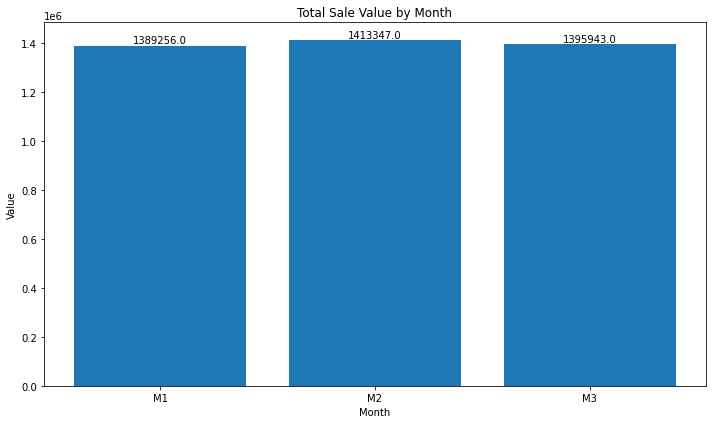

In [ ]:
# Total Order Value by Month

# Convert the Spark DataFrame to a Pandas DataFrame
pandas_df = df.select("month", "value_num").toPandas()

# Round the decimal values in "value_num" column
pandas_df["value_num"] = pandas_df["value_num"].astype(float)

# Group the data by month and calculate the total value
monthly_value = pandas_df.groupby('month')['value_num'].sum().reset_index()

# Create a bar graph
plt.figure(figsize=(10, 6))
plt.bar(monthly_value['month'], monthly_value['value_num'])
plt.title('Total Sale Value by Month')
plt.xlabel('Month')
plt.ylabel('Value')

# Add labels on top of the bars
for i, value in enumerate(monthly_value['value_num']):
    plt.text(i, value, str(value), ha='center', va='bottom')

plt.tight_layout()
plt.show()

/databricks/spark/python/pyspark/sql/pandas/utils.py:124: UserWarning: The conversion of DecimalType columns is inefficient and may take a long time. Column names: [qty_num] If those columns are not necessary, you may consider dropping them or converting to primitive types before the conversion.
  warnings.warn(


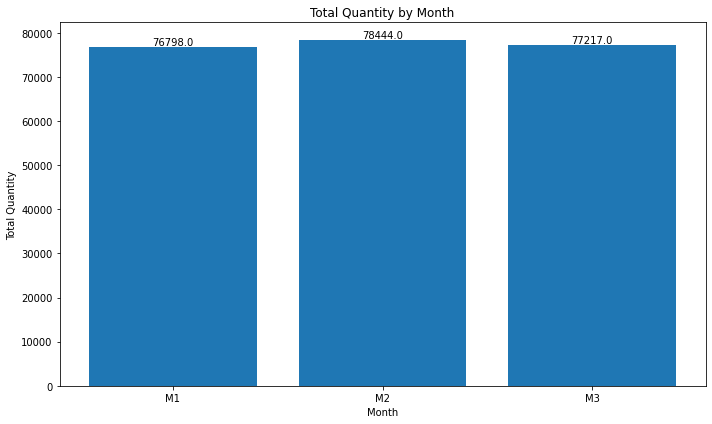

In [ ]:
# Total Order Value by Month

# Convert the Spark DataFrame to a Pandas DataFrame
pandas_df = df.select("month", "qty_num").toPandas()

# Round the decimal values in "qty_num" column
pandas_df["qty_num"] = pandas_df["qty_num"].astype(float)

# Group the data by month and calculate the total value
monthly_qty = pandas_df.groupby('month')['qty_num'].sum().reset_index()

# Create a bar graph
plt.figure(figsize=(10, 6))
plt.bar(monthly_qty['month'], monthly_qty['qty_num'])
plt.title('Total Quantity by Month')
plt.xlabel('Month')
plt.ylabel('Total Quantity')

# Add labels on top of the bars
for i, value in enumerate(monthly_qty['qty_num']):
    plt.text(i, value, str(value), ha='center', va='bottom')

plt.tight_layout()
plt.show()